## a)

Creamos la clase AMLOmañaneras en la cual importamos de RepositorioAMLO. La clase hace un preprocesamiento inicial a cada mañanera usando la función vista en clase:
- _tokeniza=False,
- _muestraCambios=False,
- _quitarAcentos=True,
- _remueveStop=True,
- _stemming=False,
- _lematiza=True,
- _removerPuntuacion=True)

La funcion matriz_mañaneras genera una matriz de textos de las conferencias mañaneras de AMLO, cada fila representa una mañanera, además de las etiquetas de fechas y semanas cumulativas respectivas.


In [2]:
from RepositorioAMLO import *
mañaneras, fechas, semanas_cum = matriz_mañaneras('2018-12-01', '2023-12-31')

[nltk_data] Downloading package punkt to C:\Users\Javier
[nltk_data]     CIMAT\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to C:\Users\Javier
[nltk_data]     CIMAT\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!



Mañaneras del 2018-12-04 al 2023-12-29. 
Total mañaneras cargadas: 1213



In [3]:
from AnalisisTopicos import *

Creamos una lista con los stopwords de varias sitios

In [1]:
'''
pip install spacy
!python -m spacy download es_core_news_sm
pip install stopwordsiso
pip install nltk

'''

import spacy
import nltk
from nltk.corpus import stopwords
import stopwordsiso

# Descargar stopwords de NLTK
nltk.download('stopwords')

# Cargar stopwords de spaCy
nlp = spacy.load('es_core_news_sm')
spacy_stopwords = nlp.Defaults.stop_words

# Cargar stopwords de NLTK
nltk_stopwords = stopwords.words('spanish')

# Cargar stopwords de stopwordsiso
iso_stopwords = stopwordsiso.stopwords('es')

# Combinar todas las listas en un conjunto para eliminar duplicados
combined_stopwords = set(spacy_stopwords).union(nltk_stopwords, iso_stopwords)

# Convertir el conjunto a una lista
final_stopwords_list = list(combined_stopwords)

Extra = ['afirmo', 'agrego', 'algun', 'anadio', 'aseguro', 'comento', 'considero', 'dejo', 'demas', 'estabamos', 'estara', 
         'estaran', 'estaras', 'estare', 'estareis', 'estaria', 'estariais', 'estariamos', 'estarian', 'estarias', 'esteis', 
         'esten', 'estes', 'estuvieramos', 'estuviesemos', 'explico', 'expreso', 'fueramos', 'fuesemos', 'habeis', 'habiais', 
         'habiamos', 'habian', 'habias', 'habra', 'habran', 'habras', 'habre', 'habreis', 'habria', 'habriais', 'habriamos', 'habrian', 
         'habrias', 'hayais', 'hubieramos', 'hubiesemos', 'indico', 'llego', 'manifesto', 'menciono', 'ningun', 'podra', 'podran', 'proximos', 
         'quedo', 'realizo', 'seais', 'senalo', 'seran', 'seras', 'sere', 'sereis', 'seria', 'seriais', 'seriamos', 'serian', 'serias', 'tendra', 
         'tendran', 'tendras', 'tendre', 'tendreis', 'tendria', 'tendriais', 'tendriamos', 'tendrian', 'tendrias', 'tengais', 'tenia', 'teniais', 
         'teniamos', 'tenian', 'tenias', 'traves', 'tuvieramos', 'tuviesemos', 'ultima', 'ultimas', 'ultimos']

final_stopwords_list += Extra

[nltk_data] Downloading package stopwords to C:\Users\Javier
[nltk_data]     CIMAT\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [4]:
'salir' in final_stopwords_list

False

In [5]:
TFIDF = TF_IDF()
TFIDF.configurar_vectorizador(mañaneras, final_stopwords_list, min_features=120, tamaño = 1200)
print("Vocabulario:", TFIDF.vocabulario)

len(TFIDF.vocabulario)

Vectorización exitosa con 1200 características (min_df=0.01).
Vocabulario: ['abajo' 'abandono' 'abasto' ... 'zedillo' 'zocalo' 'zona']


1200

## b)

In [6]:
elegir_num_topicos_estabilidad(TFIDF.tfidf_matrix.toarray(), range(2, 35))

15

In [7]:
k = 15

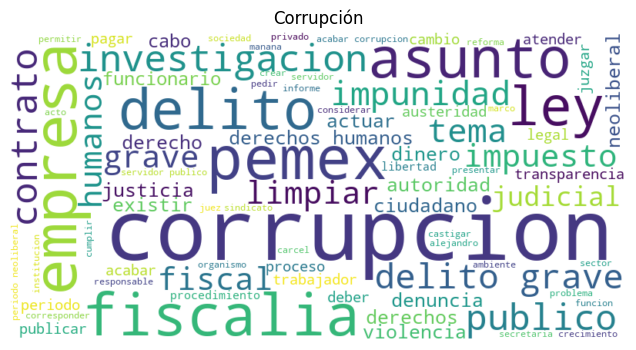

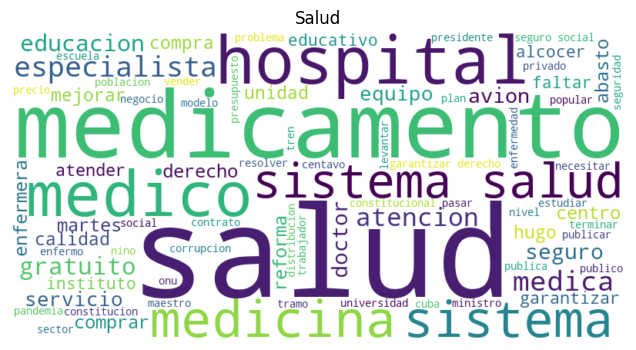

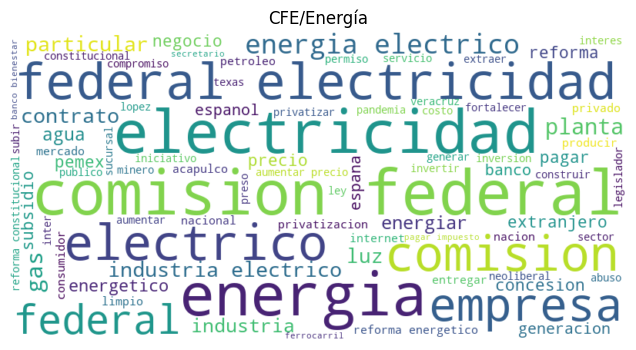

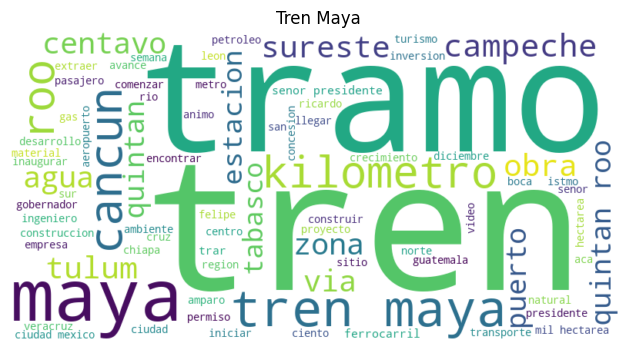

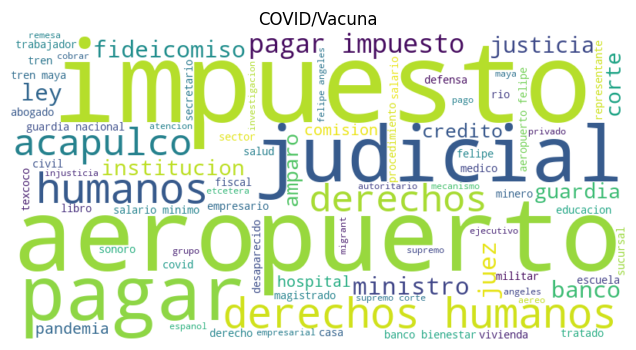

...

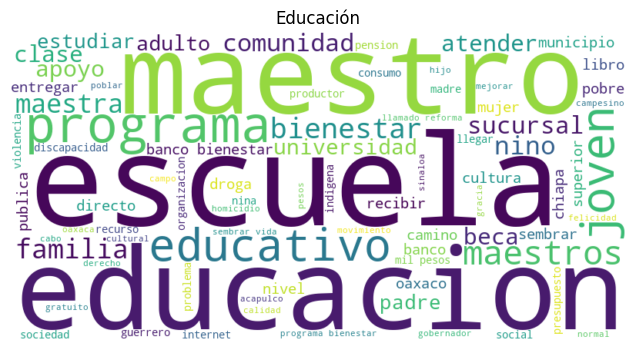

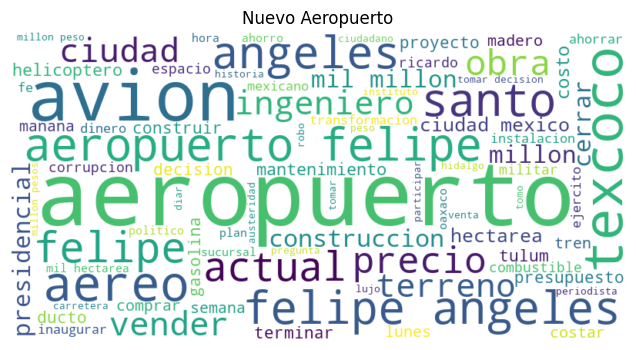

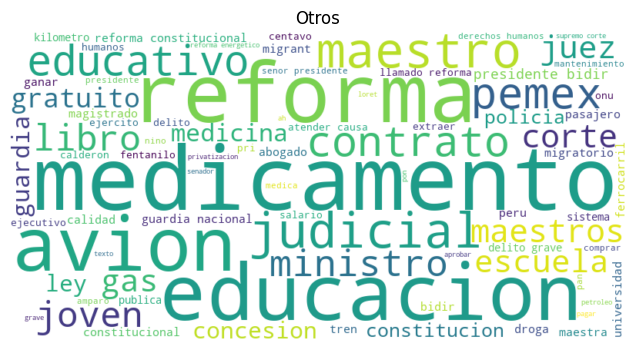

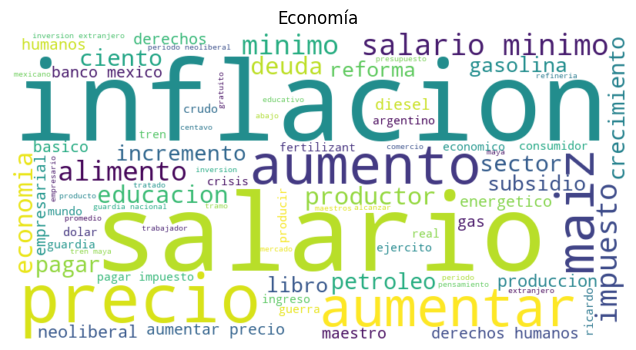

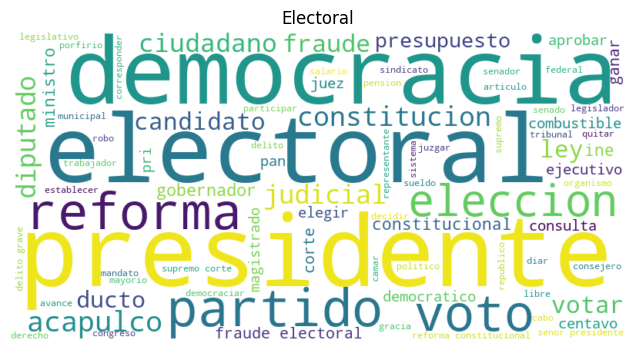

In [8]:
Topicos = ["Corrupción", "Salud", "CFE/Energía", "Tren Maya", "COVID/Vacuna", "Seguridad", "EU/RE/Migración", 
           "Desastre Acapulco", "Programas Economicos", "Opositores Politicos", "Educación", "Nuevo Aeropuerto", 
           "Otros", "Economía", "Electoral"]
top_svd = Top_SVD(k)
top_svd.obtener_topicos_svd_con_varimax(TFIDF.tfidf_matrix)
top_svd.obtener_palabras_topicos(TFIDF.vectorizador)
top_svd.establecer_nombres_topicos(Topicos)
top_svd.generar_word_clouds(TFIDF.vectorizador)


In [9]:
top_svd.asignar_topicos_a_conferencias()
top_svd.topicos_asignados

[0,
 14,
 5,
 14,
 0,
 0,
 0,
 5,
 5,
 5,
 14,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 14,
 0,
 8,
 0,
 0,
 0,
 5,
 0,
 6,
 0,
 10,
 2,
 2,
 0,
 10,
 0,
 2,
 0,
 5,
 0,
 0,
 5,
 5,
 0,
 5,
 8,
 0,
 0,
 6,
 0,
 5,
 2,
 0,
 14,
 0,
 0,
 0,
 5,
 0,
 0,
 6,
 0,
 10,
 1,
 0,
 5,
 0,
 10,
 0,
 6,
 10,
 0,
 5,
 0,
 5,
 0,
 0,
 1,
 0,
 0,
 5,
 0,
 0,
 10,
 11,
 0,
 14,
 0,
 0,
 0,
 0,
 10,
 10,
 0,
 0,
 0,
 0,
 10,
 0,
 0,
 5,
 0,
 1,
 1,
 1,
 0,
 10,
 0,
 6,
 6,
 6,
 0,
 0,
 6,
 0,
 6,
 6,
 6,
 6,
 6,
 0,
 0,
 0,
 0,
 6,
 3,
 0,
 0,
 0,
 11,
 1,
 0,
 5,
 5,
 0,
 0,
 9,
 10,
 5,
 11,
 0,
 0,
 0,
 10,
 0,
 10,
 0,
 2,
 2,
 13,
 0,
 0,
 0,
 0,
 5,
 6,
 1,
 10,
 10,
 0,
 5,
 0,
 10,
 0,
 0,
 0,
 0,
 0,
 0,
 10,
 2,
 0,
 0,
 10,
 8,
 5,
 0,
 0,
 0,
 8,
 10,
 2,
 0,
 0,
 1,
 3,
 10,
 0,
 0,
 0,
 2,
 0,
 13,
 10,
 0,
 0,
 10,
 0,
 11,
 10,
 0,
 0,
 5,
 0,
 0,
 11,
 10,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 5,
 0,
 0,
 6,
 0,
 0,
 0,
 0,
 3,
 0,
 13,
 3,
 10,
 0,
 10,
 0,
 6,
 13,
 10,
 0,
 6,
 0,
 10,
 14,
 10,
 0,

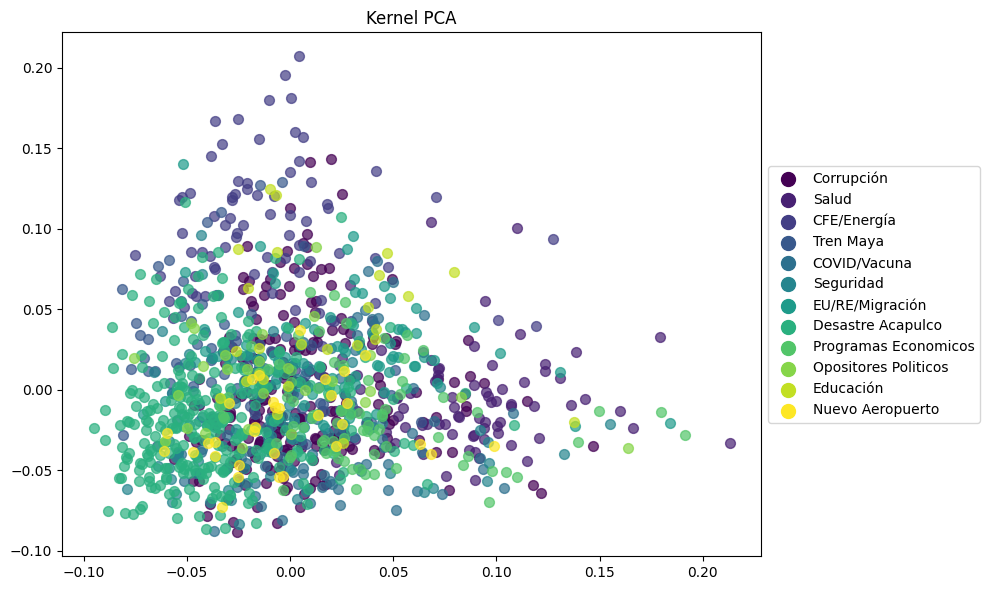

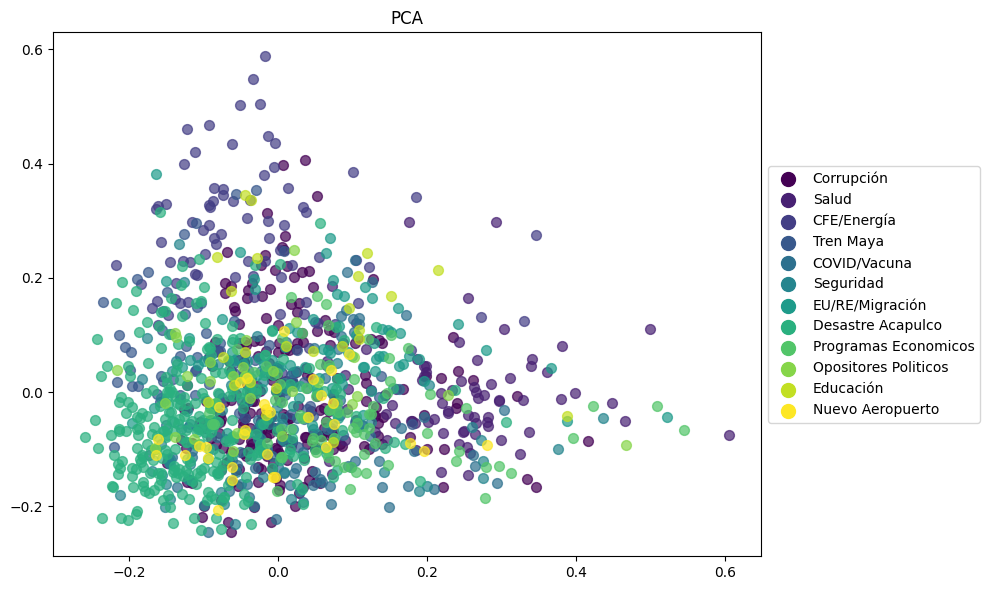

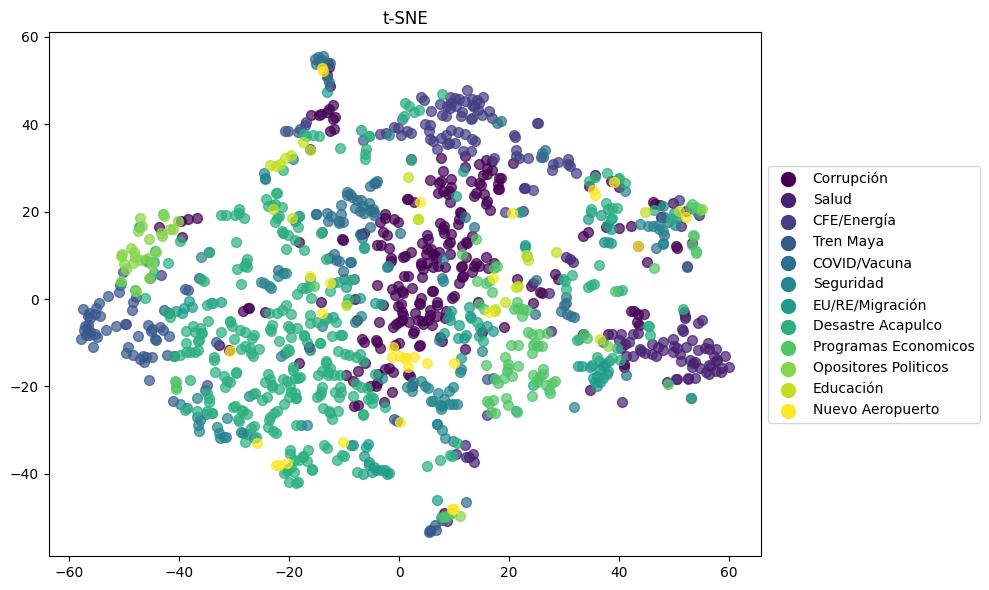

In [10]:
top_svd.visualizar_kpca()
top_svd.visualizar_pca()
top_svd.visualizar_tsne(perplexity=15)

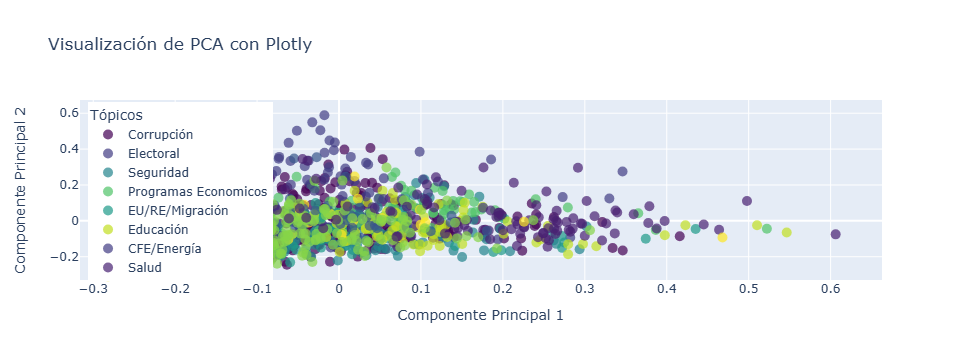

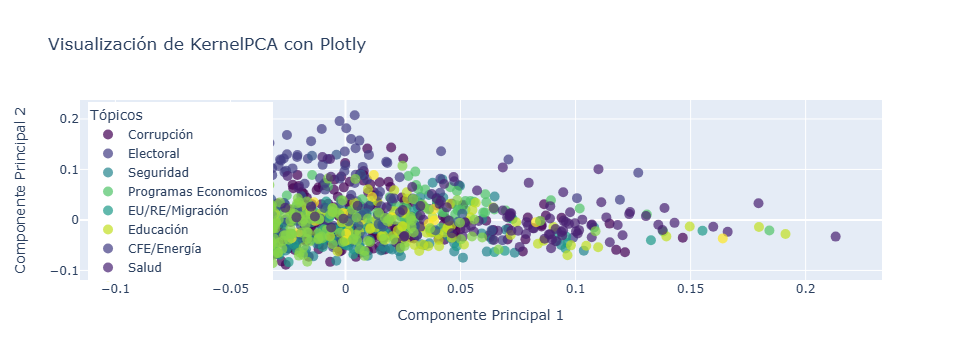

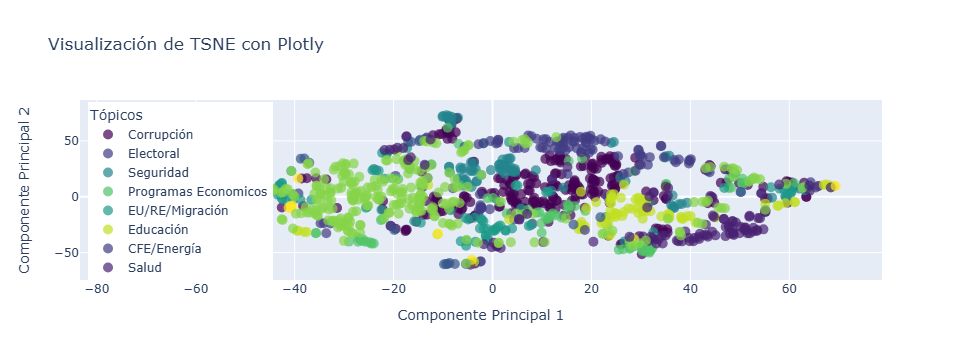

In [11]:
top_svd.visualizar_topicos('PCA', fechas, semanas_cum)
top_svd.visualizar_topicos('KernelPCA', fechas, semanas_cum)
top_svd.visualizar_topicos('TSNE', fechas, semanas_cum, perplexity=10)

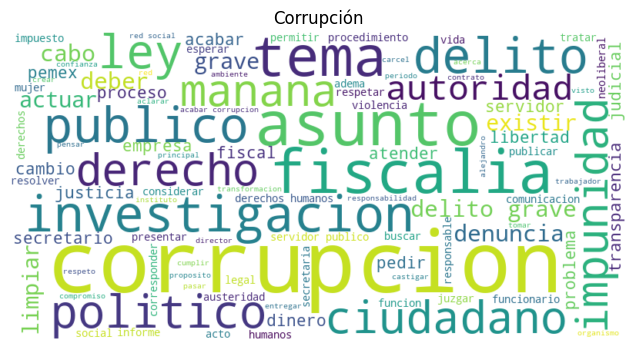

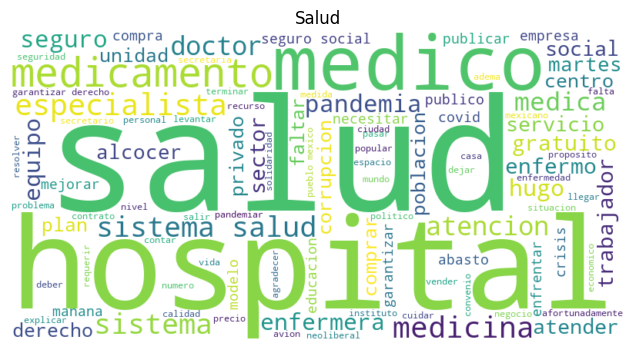

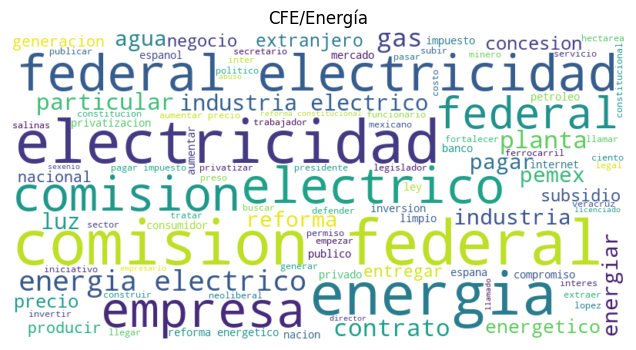

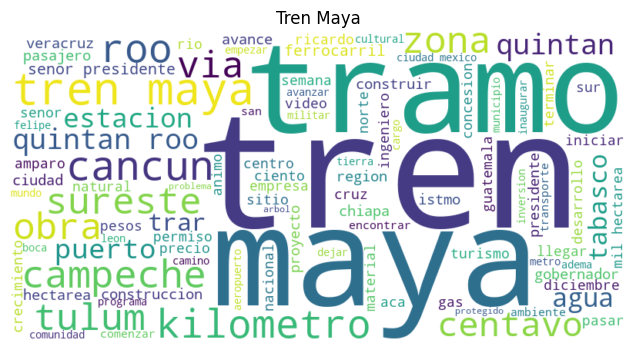

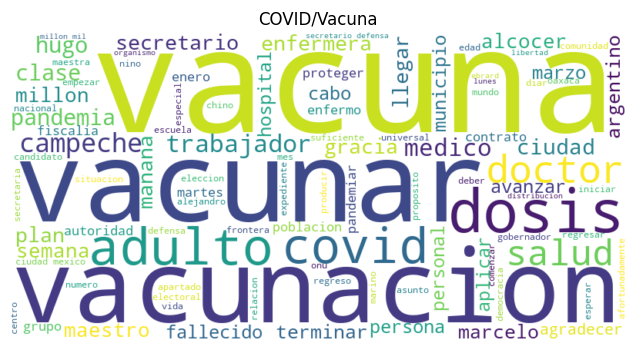

...

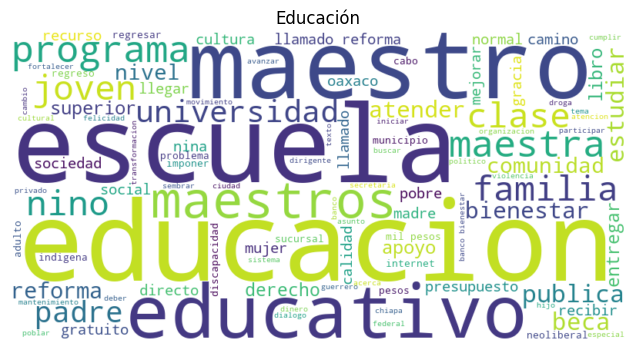

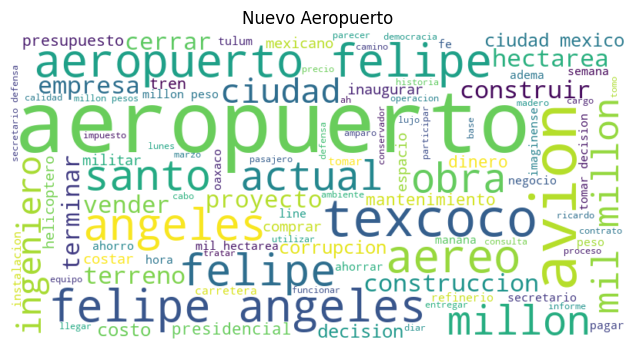

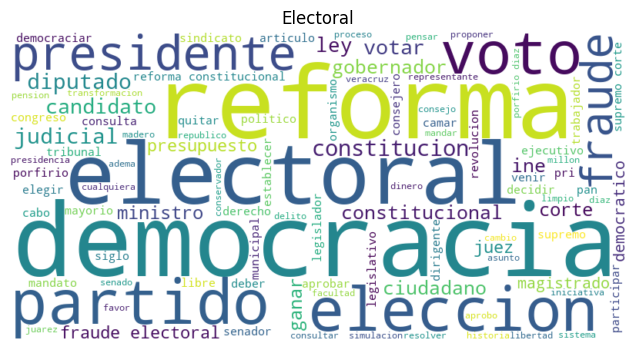

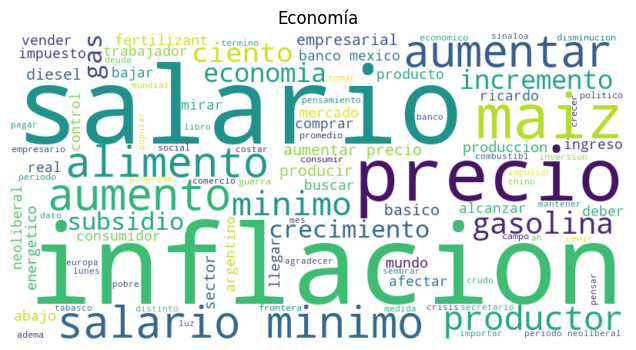

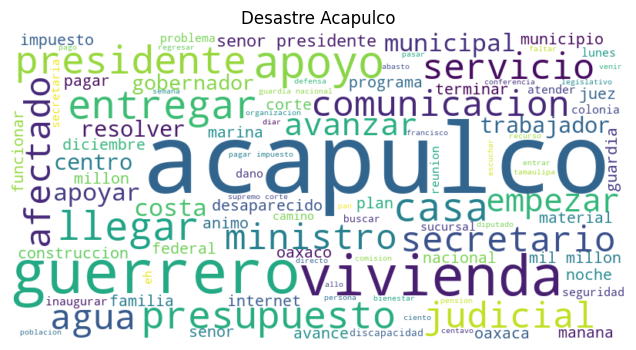

In [12]:
Topicos = ["Corrupción", "Salud", "CFE/Energía", "Tren Maya", "COVID/Vacuna", "Seguridad", "EU/RE/Migración", 
           "Política", "Programas Economicos", "PEMEX/Petróleo", "Educación", "Nuevo Aeropuerto", 
           "Electoral", "Economía", "Desastre Acapulco"]
top_nmf = Top_NMF(num_topicos=k)
top_nmf.aplicar_nmf(TFIDF.tfidf_matrix)
top_nmf.calcular_palabras_topicos(TFIDF.vectorizador)
top_nmf.establecer_nombres_topicos(Topicos)
top_nmf.generar_word_clouds()

In [13]:
top_nmf.asignar_topicos_documentos()

[5,
 12,
 5,
 12,
 0,
 9,
 11,
 5,
 5,
 5,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 0,
 9,
 9,
 6,
 11,
 8,
 2,
 2,
 0,
 8,
 2,
 2,
 2,
 5,
 2,
 9,
 5,
 5,
 9,
 5,
 8,
 8,
 13,
 6,
 0,
 5,
 2,
 8,
 0,
 0,
 9,
 0,
 5,
 9,
 9,
 6,
 10,
 10,
 1,
 13,
 5,
 0,
 10,
 9,
 6,
 10,
 12,
 5,
 10,
 5,
 11,
 5,
 13,
 10,
 10,
 5,
 5,
 11,
 10,
 11,
 10,
 12,
 12,
 8,
 0,
 5,
 5,
 10,
 9,
 9,
 9,
 8,
 10,
 5,
 8,
 5,
 10,
 9,
 1,
 1,
 0,
 10,
 9,
 6,
 6,
 6,
 6,
 5,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 0,
 8,
 10,
 9,
 6,
 3,
 0,
 9,
 8,
 11,
 13,
 2,
 5,
 5,
 10,
 5,
 7,
 13,
 5,
 11,
 8,
 0,
 8,
 10,
 6,
 8,
 2,
 2,
 2,
 13,
 0,
 0,
 5,
 10,
 5,
 8,
 1,
 10,
 2,
 0,
 5,
 13,
 10,
 8,
 0,
 10,
 9,
 11,
 9,
 10,
 2,
 11,
 0,
 10,
 8,
 5,
 12,
 0,
 0,
 8,
 10,
 2,
 10,
 10,
 10,
 3,
 10,
 9,
 9,
 11,
 2,
 6,
 13,
 10,
 0,
 0,
 10,
 8,
 11,
 8,
 11,
 12,
 5,
 5,
 0,
 11,
 10,
 0,
 0,
 8,
 6,
 12,
 13,
 12,
 5,
 5,
 0,
 6,
 6,
 5,
 1,
 0,
 3,
 7,
 13,
 3,
 10,
 0,
 10,
 8,
 6,
 8,
 8,
 8,
 6,


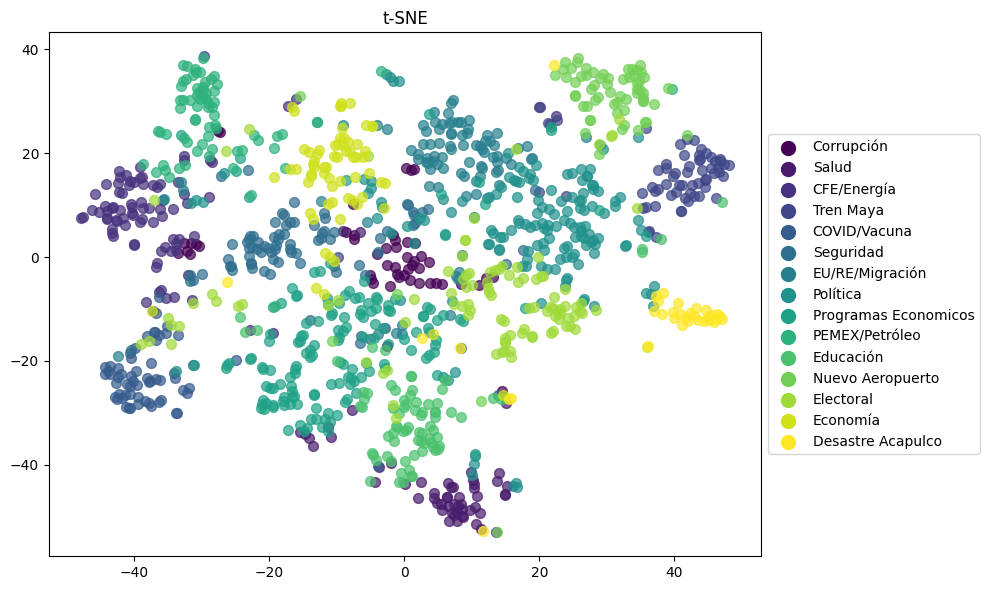

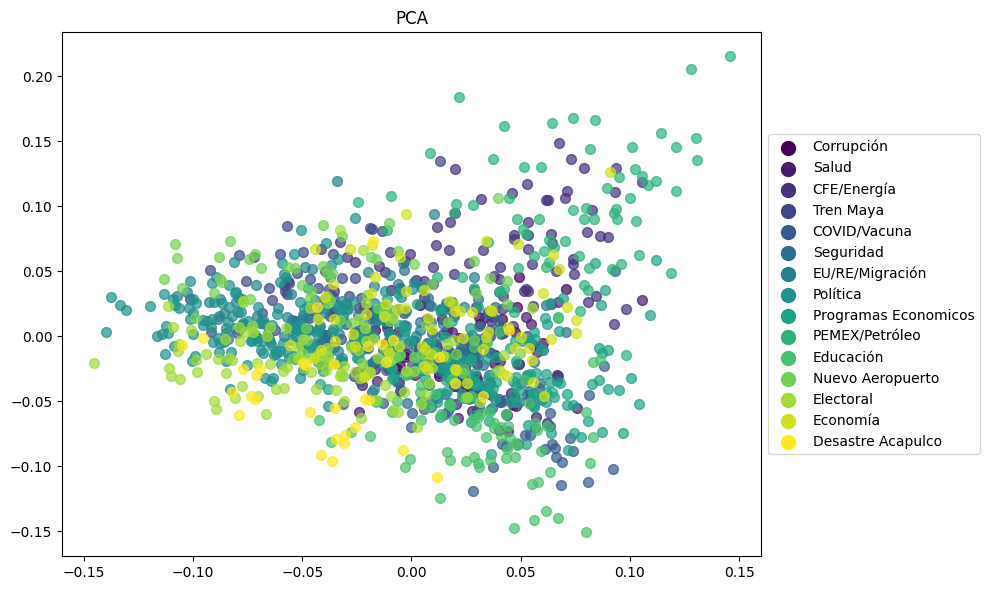

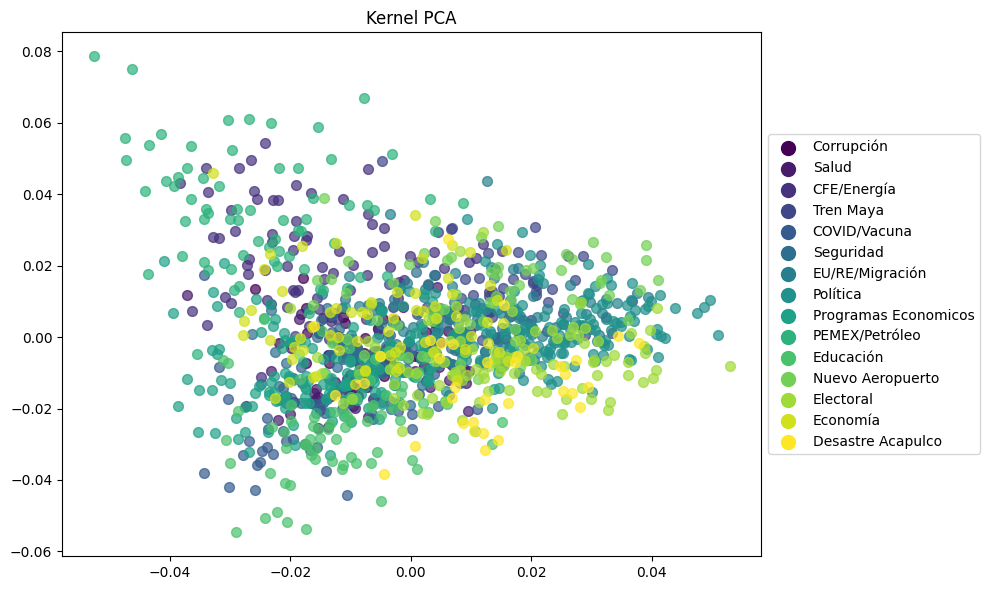

In [14]:
top_nmf.visualizar_tsne(perplexity=20)
top_nmf.visualizar_pca()
top_nmf.visualizar_kpca()

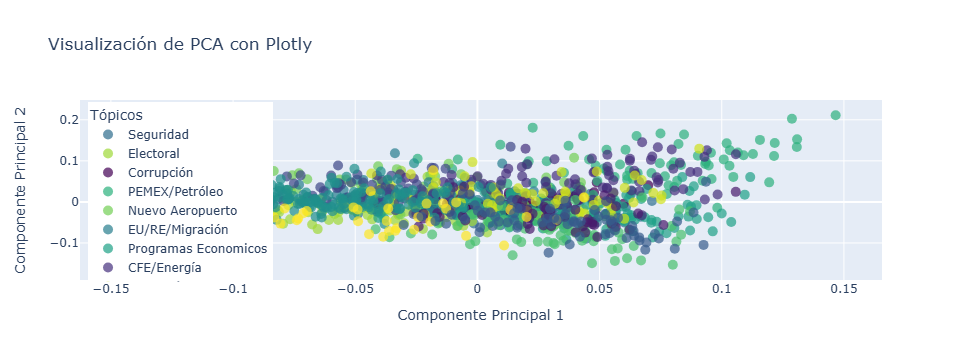

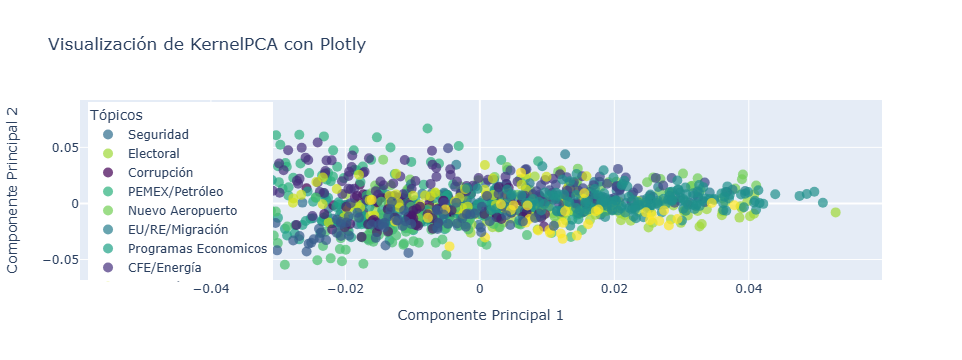

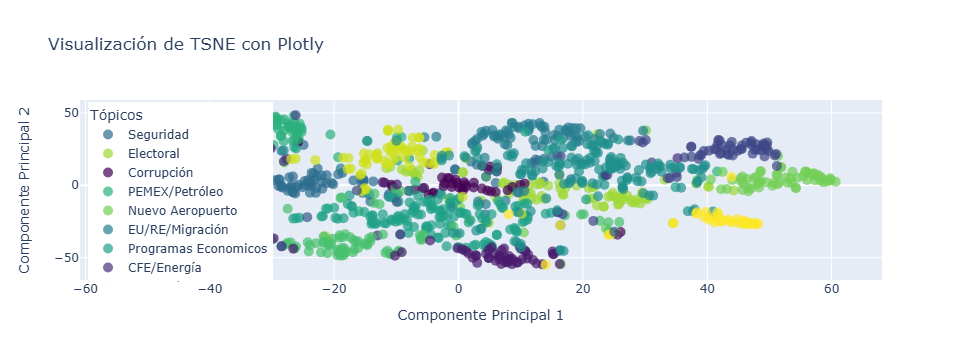

In [15]:
top_nmf.visualizar_topicos('PCA', fechas, semanas_cum)
top_nmf.visualizar_topicos('KernelPCA', fechas, semanas_cum)
top_nmf.visualizar_topicos('TSNE', fechas, semanas_cum, perplexity=15)

In [16]:
k2 = 15

La puntuación media de silueta para 15 clústeres es: 0.17176255739167007


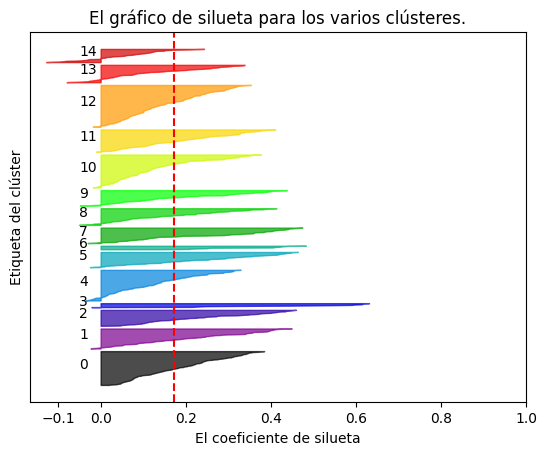

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.cluster import KMeans

def calcular_y_graficar_silueta(document_topic_matrix, n_clusters=5):
    # Ajuste del modelo K-Means
    model = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = model.fit_predict(document_topic_matrix)

    # Calcular la puntuación de silueta media de todos los documentos
    silhouette_avg = silhouette_score(document_topic_matrix, cluster_labels)
    print(f"La puntuación media de silueta para {n_clusters} clústeres es: {silhouette_avg}")

    # Calcular las puntuaciones de silueta para cada muestra
    sample_silhouette_values = silhouette_samples(document_topic_matrix, cluster_labels)

    # Crear un gráfico de silueta
    fig, ax = plt.subplots()
    y_lower = 10
    for i in range(n_clusters):
        # Agregar las puntuaciones de silueta para las muestras pertenecientes al clúster i, y luego ordenarlas
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = plt.cm.nipy_spectral(float(i) / n_clusters)
        ax.fill_betweenx(np.arange(y_lower, y_upper),
                         0, ith_cluster_silhouette_values,
                         facecolor=color, edgecolor=color, alpha=0.7)

        # Etiquetar los gráficos de silueta con el número del clúster en el medio
        ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10  # 10 para el 0 muestras

    ax.set_title("El gráfico de silueta para los varios clústeres.")
    ax.set_xlabel("El coeficiente de silueta")
    ax.set_ylabel("Etiqueta del clúster")

    # La línea vertical para la puntuación media de silueta de todos los valores
    ax.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax.set_yticks([])  # Limpiar las etiquetas del eje y
    ax.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    plt.show()

calcular_y_graficar_silueta(top_nmf.document_topic_matrix, n_clusters=k2)



La puntuación media de silueta para 15 clústeres es: 0.17176255739167007


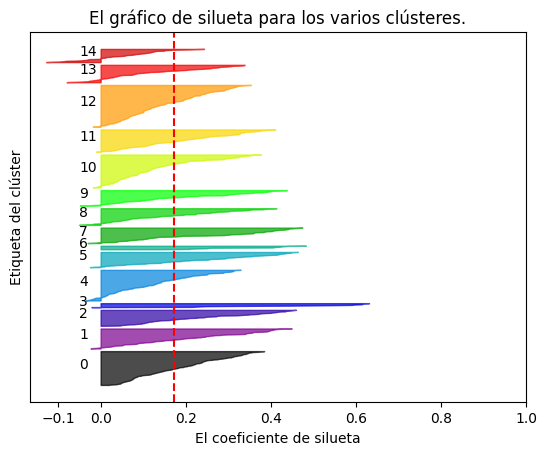

In [18]:
calcular_y_graficar_silueta(top_nmf.document_topic_matrix, n_clusters=15)


## e)

In [19]:
import numpy as np
import pandas as pd

def calcular_indice_topicos(top_nmf, semanas_cum):
    num_topicos = top_nmf.num_topicos
    
    # Crear DataFrame para f_{i,j}, inicializado para almacenar floats
    f_ij = pd.DataFrame(0.0, index=np.unique(semanas_cum), columns=range(num_topicos))
    for doc_idx, topico in enumerate(top_nmf.topicos_asignados):
        semana = semanas_cum[doc_idx]
        f_ij.at[semana, topico] += 1
    
    # Calcular s_i para cada "mes" utilizando semanas_cum para determinar los meses
    # Asumiendo que un "mes" se podría aproximar como cada 4 semanas
    max_semana = np.max(semanas_cum)
    s_i = pd.DataFrame(0.0, index=range(1, max_semana // 4 + 2), columns=range(num_topicos))
    for doc_idx, topico in enumerate(top_nmf.topicos_asignados):
        mes_aprox = semanas_cum[doc_idx] // 4 + 1
        s_i.at[mes_aprox, topico] += 1

    # Calcular max_j(f_{i,j}) y max_i(s_i)
    max_f_ij = f_ij.max()
    max_s_i = s_i.max()

    # Calcular H_j para cada semana
    h_j = {}
    for semana in f_ij.index:
        p_ij = f_ij.loc[semana] / f_ij.loc[semana].sum()
        h_j[semana] = -np.sum(p_ij * np.log(p_ij + np.finfo(float).eps))  # Añade un pequeño epsilon para evitar log(0)

    # Calcular I_{i,j}
    i_ij = pd.DataFrame(0.0, index=f_ij.index, columns=range(num_topicos))
    for semana in f_ij.index:
        mes_aprox = semana // 4 + 1
        for topico in range(num_topicos):
            i_ij.at[semana, topico] = (f_ij.at[semana, topico] / max_f_ij[topico]) * \
                                      (s_i.at[mes_aprox, topico] / max_s_i[topico]) * \
                                      np.exp(-h_j[semana])

    return i_ij

indice_topicos = calcular_indice_topicos(top_nmf, semanas_cum)

indice_topicos

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
1,0.000000,0.0,0.0,0.000000,0.0,0.088189,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.026457,0.000000,0.000000
2,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.050000,0.000000,0.000000
4,0.022222,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.066667,0.0,0.022222,0.000000,0.000000,0.000000
5,0.000000,0.0,0.0,0.000000,0.0,0.375000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,1.000000,0.0,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,0.000000,0.0,0.0,0.050000,0.0,0.000000,0.000000,0.010000,0.0,0.000000,0.0,0.000000,0.005000,0.016667,0.013333
262,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.023570,0.017678,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.047140
263,0.000000,0.0,0.0,0.176777,0.0,0.014731,0.000000,0.017678,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
264,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.008333,0.000000,0.0,0.004545,0.0,0.000000,0.006250,0.000000,0.003333


In [20]:
def normalizar_indices(i_ij, metodo='suma'):
    """
    Normaliza los índices de tópicos según el método especificado.
    
    Args:
        i_ij (pd.DataFrame): DataFrame conteniendo los índices de tópicos.
        metodo (str): Método de normalización a utilizar. Puede ser 'suma' o 'min-max'.
        
    Returns:
        pd.DataFrame: DataFrame con los índices normalizados.
    """
    if metodo == 'suma':
        # Normalización por la suma total de los índices de cada semana
        suma_indices_semana = i_ij.sum(axis=1)
        i_ij_normalizado = i_ij.div(suma_indices_semana, axis=0)
    elif metodo == 'min-max':
        # Normalización min-max para el rango [0, 1]
        min_val = i_ij.min().min()
        max_val = i_ij.max().max()
        i_ij_normalizado = (i_ij - min_val) / (max_val - min_val)
    
    elif metodo =='z-score':
        media = i_ij.mean()
        desviacion_std = i_ij.std()
        
        # Aplicar normalización Z-score
        i_ij_normalizado = (i_ij - media) / desviacion_std
        
        return i_ij_normalizado
    else:
        raise ValueError("Método no soportado. Use 'suma', 'z-score' o 'min-max'.")
    
    return i_ij_normalizado


indice_topicos_normalizados = normalizar_indices(indice_topicos, metodo='min-max')
indice_topicos_normalizados

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
1,0.000000,0.0,0.0,0.000000,0.0,0.088189,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.026457,0.000000,0.000000
2,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.050000,0.000000,0.000000
4,0.022222,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.066667,0.0,0.022222,0.000000,0.000000,0.000000
5,0.000000,0.0,0.0,0.000000,0.0,0.375000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,1.000000,0.0,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,0.000000,0.0,0.0,0.050000,0.0,0.000000,0.000000,0.010000,0.0,0.000000,0.0,0.000000,0.005000,0.016667,0.013333
262,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.023570,0.017678,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.047140
263,0.000000,0.0,0.0,0.176777,0.0,0.014731,0.000000,0.017678,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
264,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.008333,0.000000,0.0,0.004545,0.0,0.000000,0.006250,0.000000,0.003333


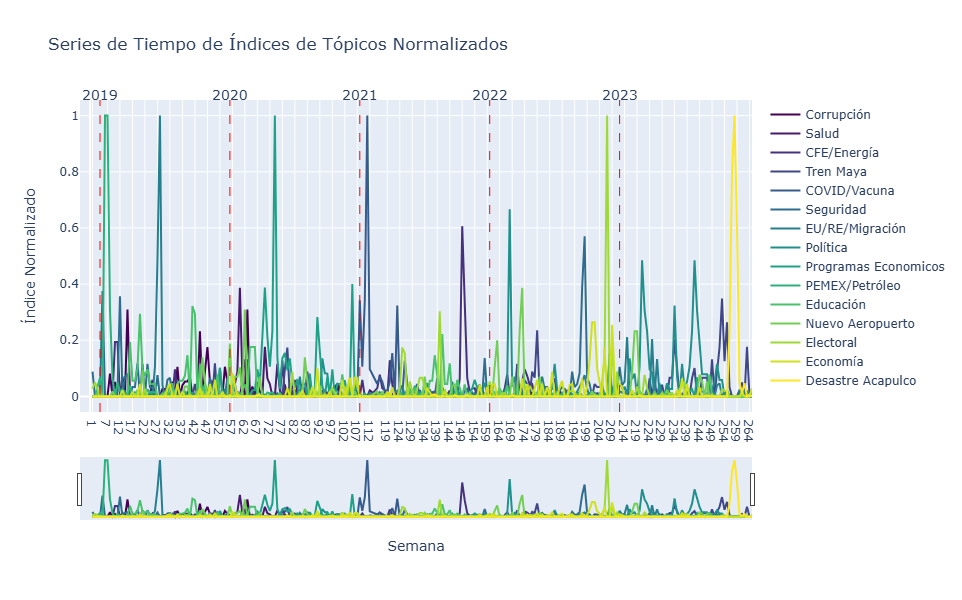

In [21]:
import plotly.graph_objects as go

def Serie_Tiempo_plotly(indice_topicos_normalizados, semanas_cum, top_nmf):
    """
    Grafica las series de tiempo de los índices de tópicos normalizados en un solo plot utilizando Plotly,
    con la opción de barras de desplazamiento en el eje X y escala normal en el eje Y.

    graficar_series_tiempo_topicos_plotly(indice_topicos_normalizados, semanas_cum, top_nmf)
    Args:
        indice_topicos_normalizados (pd.DataFrame): DataFrame conteniendo los índices de tópicos normalizados.
        semanas_cum (list): Lista de semanas acumuladas correspondientes a cada conferencia de prensa.
        top_nmf (Top_NMF): Objeto Top_NMF conteniendo información sobre los tópicos.
    """
    num_topicos = indice_topicos_normalizados.shape[1]

    # Obtener las etiquetas únicas de las semanas
    semanas_unicas = np.unique(semanas_cum)

    # Crear figura utilizando Plotly
    fig = go.Figure()

    # Generar colores utilizando el mapa de colores Viridis
    colores = cm.viridis(np.linspace(0, 1, num_topicos))

    # Agregar trazas para cada serie de tiempo de tópico
    for i in range(num_topicos):
        fig.add_trace(go.Scatter(x=semanas_unicas, y=indice_topicos_normalizados.iloc[:, i],
                                mode='lines', name=top_nmf.nombre_topicos[i],
                                line=dict(color=f'rgb{tuple(int(x*255) for x in colores[i])}')))

    # Agregar líneas verticales para los inicios de cada año desde 2019 hasta 2023
    años = range(2019, 2024)
    semanas_año = [4 + 52 * i for i in range(len(años))]  # Comenzando desde la semana 5 de 2019

    for año, semana_año in zip(años, semanas_año):
        fig.add_shape(type='line',
                    x0=semana_año, y0=0, x1=semana_año, y1=1,
                    xref='x', yref='paper',
                    line=dict(color='red', width=1, dash='dash'))
        
        fig.add_annotation(x=semana_año, y=1.05, xref='x', yref='paper',
                        text=str(año), showarrow=False, font=dict(size=14))

    # Personalizar diseño del gráfico
    fig.update_layout(
        title='Series de Tiempo de Índices de Tópicos Normalizados',
        xaxis=dict(title='Semana', tickvals=semanas_unicas[::5], ticktext=semanas_unicas[::5],
                rangeslider=dict(visible=True)),
        yaxis=dict(title='Índice Normalizado'),
        legend=dict(x=1.02, y=1, orientation='v'),
        height=600, width=1800,
    )
    
    #fig.write_html("Lineal del tiempo.html")
    # Mostrar el gráfico
    fig.show()

Serie_Tiempo_plotly(indice_topicos_normalizados, semanas_cum, top_nmf)

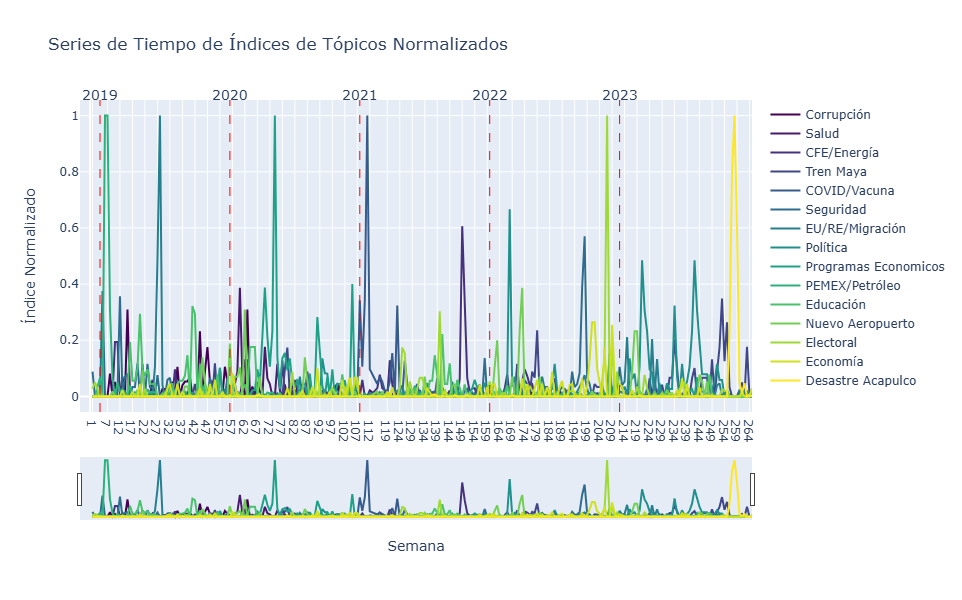

In [22]:
# Con Z-Score
Serie_Tiempo_plotly(indice_topicos_normalizados, semanas_cum, top_nmf)

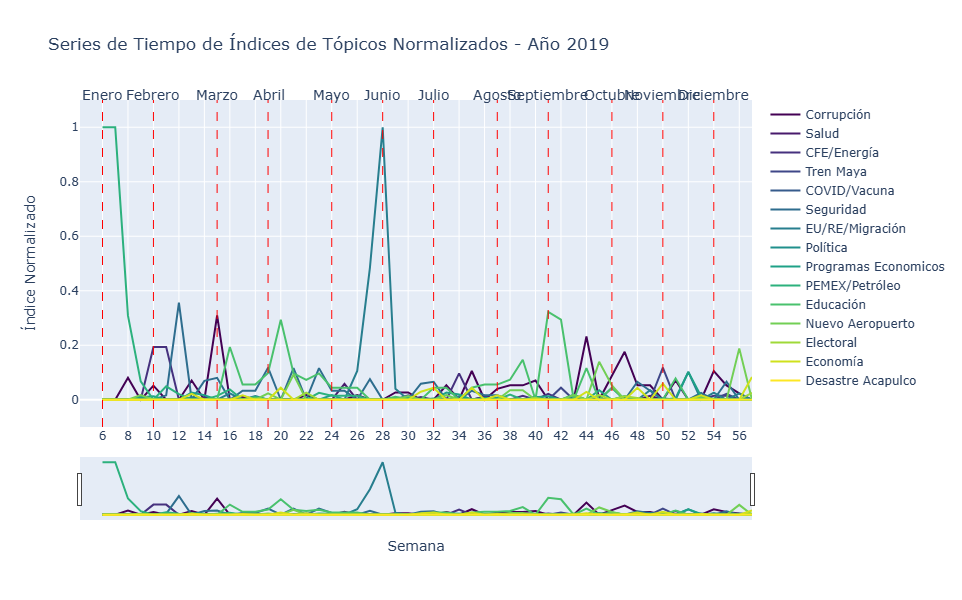

In [23]:
import plotly.graph_objects as go

def graficar_series_tiempo_topicos_año_plotly(indice_topicos_normalizados, semanas_cum, top_nmf, año):
    """
    Grafica las series de tiempo de los índices de tópicos normalizados para un año específico utilizando Plotly,
    con la opción de barras de desplazamiento en el eje X y escala normal en el eje Y.
    
    Args:
        indice_topicos_normalizados (pd.DataFrame): DataFrame conteniendo los índices de tópicos normalizados.
        semanas_cum (list): Lista de semanas acumuladas correspondientes a cada conferencia de prensa.
        top_nmf (Top_NMF): Objeto Top_NMF conteniendo información sobre los tópicos.
        año (int): Año específico para graficar las series de tiempo.
    """
    num_topicos = indice_topicos_normalizados.shape[1]
    
    # Obtener las semanas correspondientes al año específico
    semana_inicio = (año - 2018) * 52 - 48  # Ajuste para comenzar en diciembre 4, 2018
    semana_fin = semana_inicio + 52
    semanas_año = semanas_cum[semana_inicio:semana_fin]
    
    # Filtrar los datos para el año específico
    indice_topicos_año = indice_topicos_normalizados.iloc[semana_inicio:semana_fin, :]
    
    # Crear figura utilizando Plotly
    fig = go.Figure()
    
    # Generar colores utilizando el mapa de colores Viridis
    colores = cm.viridis(np.linspace(0, 1, num_topicos))
    
    # Agregar trazas para cada serie de tiempo de tópico
    for i in range(num_topicos):
        fig.add_trace(go.Scatter(x=semanas_año, y=indice_topicos_año.iloc[:, i],
                                 mode='lines', name=top_nmf.nombre_topicos[i],
                                 line=dict(color=f'rgb{tuple(int(x*255) for x in colores[i])}')))
    
    # Agregar líneas verticales para cada mes
    meses = ['Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio',
             'Julio', 'Agosto', 'Septiembre', 'Octubre', 'Noviembre', 'Diciembre']
    semanas_mes = [4, 8, 13, 17, 22, 26, 30, 35, 39, 44, 48, 52]
    
    for mes, semana_mes in zip(meses, semanas_mes):
        if semana_mes - 4 < len(semanas_año):
            fig.add_shape(type='line',
                          x0=semanas_año[semana_mes - 4], y0=0, x1=semanas_año[semana_mes - 4], y1=1,
                          xref='x', yref='paper',
                          line=dict(color='red', width=1, dash='dash'))
            
            fig.add_annotation(x=semanas_año[semana_mes - 4], y=1.05, xref='x', yref='paper',
                               text=mes, showarrow=False, font=dict(size=14))
    
    # Obtener el rango de valores de los índices de tópicos para el año específico
    y_min = indice_topicos_año.min().min()
    y_max = indice_topicos_año.max().max()
    
    # Calcular el margen como el 10% del rango total
    margen = (y_max - y_min) * 0.1
    
    # Ajustar el rango del eje Y con el margen
    y_min -= margen
    y_max += margen
    
    # Personalizar diseño del gráfico
    fig.update_layout(
        title=f'Series de Tiempo de Índices de Tópicos Normalizados - Año {año}',
        xaxis=dict(title='Semana', tickvals=semanas_año[::2], ticktext=semanas_año[::2],
                   rangeslider=dict(visible=True)),
        yaxis=dict(title='Índice Normalizado', range=[y_min, y_max]),
        legend=dict(x=1.02, y=1, orientation='v'),
        height=600, width=1200,
    )
    
    # Mostrar el gráfico
    fig.show()

graficar_series_tiempo_topicos_año_plotly(indice_topicos_normalizados, np.unique(semanas_cum), top_nmf, 2019)
